# Gold ETFs Price Forecast, Trends, & 2 Year Predictions



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from pandas import DataFrame
import itertools
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

from math import sqrt
from sklearn.metrics import mean_squared_error, make_scorer, mean_absolute_error

# Analysis imports
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima.arima import auto_arima
from prophet import Prophet

import warnings
warnings.filterwarnings('ignore') #this would remove any deprecated warning

# Exploratory Data Analysis

In [2]:
data_gld = pd.read_csv('GLD.csv')
print("GLD Data: " + str(data_gld.shape))
data_gld.head(20)

GLD Data: (3780, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
0,2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000
1,2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2,2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000
3,2004-11-23,44.880001,44.919998,44.720001,44.750000,44.750000,3169200
4,2004-11-24,44.930000,45.049999,44.790001,45.049999,45.049999,6105100
5,2004-11-26,45.250000,45.599998,45.060001,45.290001,45.290001,3097700
6,2004-11-29,45.099998,45.500000,45.080002,45.400002,45.400002,3759000
7,2004-11-30,45.369999,45.410000,44.820000,45.119999,45.119999,3857200
8,2004-12-01,45.279999,45.590000,45.259998,45.380001,45.380001,2037500
9,2004-12-02,45.549999,45.570000,44.680000,44.950001,44.950001,6457800


In [3]:
data_gld.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3780 entries, 0 to 3779
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3780 non-null   object 
 1   Open       3780 non-null   float64
 2   High       3780 non-null   float64
 3   Low        3780 non-null   float64
 4   Close      3780 non-null   float64
 5   Adj Close  3780 non-null   float64
 6   Volume     3780 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 206.8+ KB


In [4]:
data_gld.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3780.000000,3780.000000,3780.000000,3780.000000,3780.000000,3.780000e+03
mean,109.298553,109.854220,108.700423,109.297146,109.297146,9.677284e+06
std,33.461304,33.575604,33.326566,33.458163,33.458163,7.196708e+06
min,41.029999,41.360001,41.020000,41.259998,41.259998,3.193000e+05
25%,87.362501,88.407504,86.715000,87.419998,87.419998,5.089775e+06
50%,117.024998,117.444999,116.420002,116.985000,116.985000,7.992400e+06
75%,127.002500,127.532500,126.432501,127.127503,127.127503,1.205778e+07
max,184.580002,185.850006,182.100006,184.589996,184.589996,9.380420e+07


In [5]:
print("Dataframe contains GLD Data from from " + str(data_gld['Date'].min()) + " to " + str(data_gld['Date'].max()))

Dataframe contains GLD Data from from 2004-11-18 to 2019-11-22


# EDA Conclusion

In [6]:
# Read in csv file and parse date as datetime
dateparser = lambda dates: pd.to_datetime(dates, format='%Y-%m-%d')
ffill_data = pd.read_csv('GLD.csv', parse_dates=['Date'], date_parser=dateparser)
print("GLD Data Before Forward Fill: " + str(ffill_data.shape))


cols = ffill_data.columns #store original column names
ffill_data.set_index("Date", inplace=True)
ffill_data.head(10)

GLD Data Before Forward Fill: (3780, 7)


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000
2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000
2004-11-23,44.880001,44.919998,44.720001,44.750000,44.750000,3169200
2004-11-24,44.930000,45.049999,44.790001,45.049999,45.049999,6105100
2004-11-26,45.250000,45.599998,45.060001,45.290001,45.290001,3097700
2004-11-29,45.099998,45.500000,45.080002,45.400002,45.400002,3759000
2004-11-30,45.369999,45.410000,44.820000,45.119999,45.119999,3857200
2004-12-01,45.279999,45.590000,45.259998,45.380001,45.380001,2037500


In [7]:
# Resample dates and forward fill missing values with previous values
ffill_data = ffill_data.resample("D").ffill().reset_index()

In [8]:
print("GLD Data After Forward Fill: " + str(ffill_data.shape))
ffill_data.head(10)

GLD Data After Forward Fill: (5483, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
0,2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000
1,2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2,2004-11-20,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
3,2004-11-21,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
4,2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000
5,2004-11-23,44.880001,44.919998,44.720001,44.750000,44.750000,3169200
6,2004-11-24,44.930000,45.049999,44.790001,45.049999,45.049999,6105100
7,2004-11-25,44.930000,45.049999,44.790001,45.049999,45.049999,6105100
8,2004-11-26,45.250000,45.599998,45.060001,45.290001,45.290001,3097700
9,2004-11-27,45.250000,45.599998,45.060001,45.290001,45.290001,3097700


In [9]:
# Sort by date in ascending order & export to new csv file
ffill_data = ffill_data[cols] #revert column order
ffill_data.sort_values(by='Date', inplace=True)
ffill_data.to_csv('gld-nomissing.csv', index=False)

# EDA Conclusion
- the original csv file used to have 3780 rows of data. After filling the missing dates, we now have 5483 rows of data.

# Visualize The Data

In [10]:
# Read in the gld prices file with no missing data
# Convert the date column from string to date and make it the index
dateparser = lambda dates: pd.to_datetime(dates,format='%Y-%m-%d')
data = pd.read_csv('gld-nomissing.csv', index_col='Date', parse_dates=['Date'], date_parser=dateparser)
print("GLD Prices for All Days, including weekends and holidays: " + str(data.shape))
data.head()


GLD Prices for All Days, including weekends and holidays: (5483, 6)


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000
2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2004-11-20,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2004-11-21,44.490002,44.919998,44.470001,44.779999,44.779999,11655300
2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000


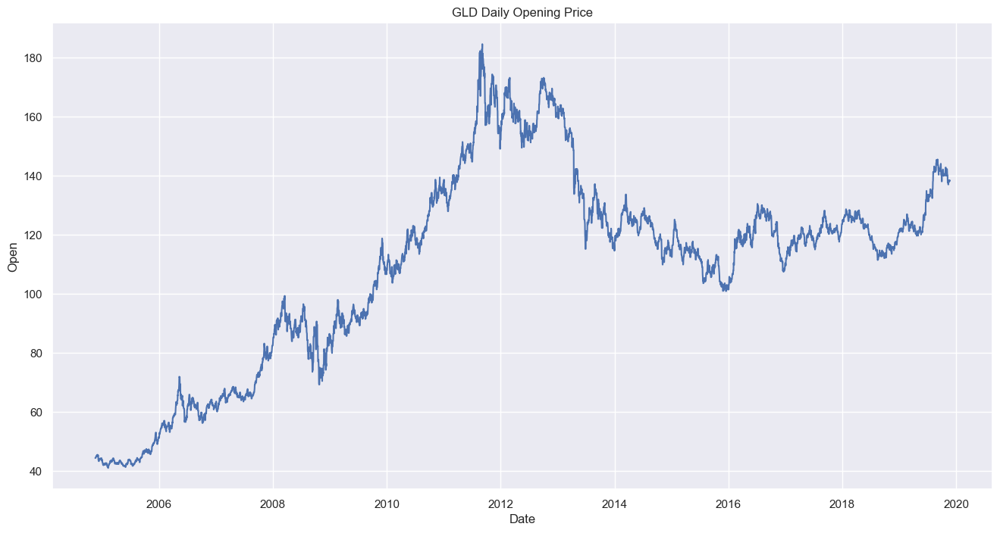

In [11]:
sns.set(style="darkgrid")
plt.figure(figsize=(16,8))
sns.lineplot(x=data.index, y='Open', data=data, linewidth=1.5).set_title('GLD Daily Opening Price')
plt.show()

# Check If Time Series Data is Stationary
Data needs to be stationary before modeling. Run Dicky-Fuller test on the Open Price

In [12]:
adfuller_result = adfuller(data['Open'])
print('ADF Statistic: ', adfuller_result[0])
print('p-value: ', round(adfuller_result[1]*100,2),'%')

ADF Statistic:  -1.8025174981713072
p-value:  37.92 %


### Conclusion: The data is not stationary because the p-value is greater than 5%

# Make the Time Series Data Stationary
Use the difference method, square root and take the difference twice method to see which is a best way to make the data stationary

In [13]:
# Diff Method
data_diff = data.diff().dropna()
diff_adfuller_result = adfuller(data_diff['Open'])
print('Difference Method ADF Statistic: ', diff_adfuller_result[0])
print('Difference Method p-value: ', diff_adfuller_result[1])

Difference Method ADF Statistic:  -16.73825009330668
Difference Method p-value:  1.3650617859603452e-29


In [14]:
data_sqrt = np.sqrt(data).dropna()
sqrt_adfuller_result = adfuller(data_sqrt['Open'])
print('Square Root Method ADF Statistic: ', sqrt_adfuller_result[0])
print('Square Root Methodp-value: ', round(sqrt_adfuller_result[1]*100,2),'%')

Square Root Method ADF Statistic:  -2.0279705213801646
Square Root Methodp-value:  27.44 %


In [15]:
# Diff Twice Method
data_difftwice = data.diff().diff().dropna()
difftwice_adfuller_result = adfuller(data_difftwice['Open'])
print('Difference Method ADF Statistic: ', difftwice_adfuller_result[0])
print('Difference Method p-value: ', difftwice_adfuller_result[1])

Difference Method ADF Statistic:  -21.136725105626194
Difference Method p-value:  0.0


### Conclusion
The Square Root methods didn't produce a p-value less than 0.05. So we should eliminate it. Both Differencing once and twice methods produced a p-value less than 0.05 but Differencing Twice produced a much more negative ADF Statistic. That's what we want, the more negative the better.

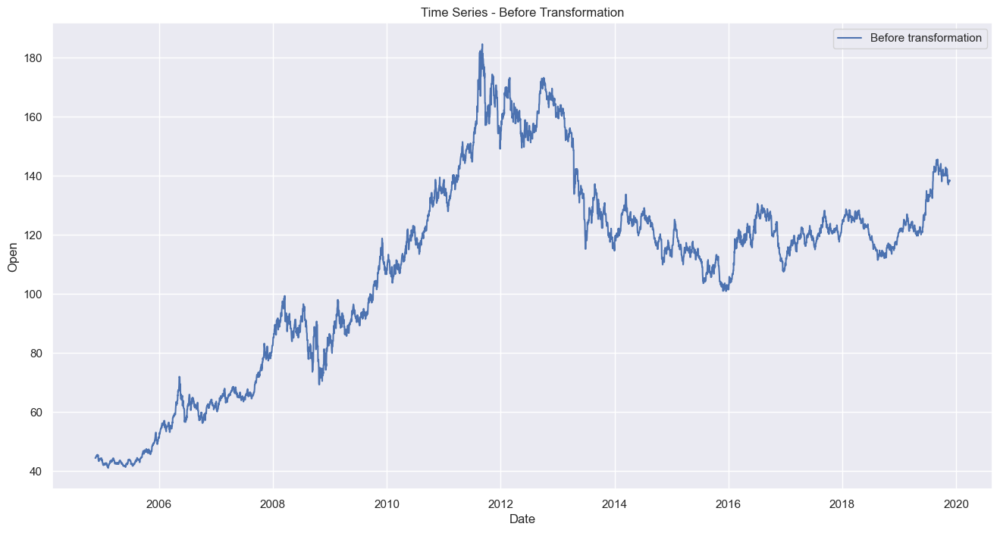

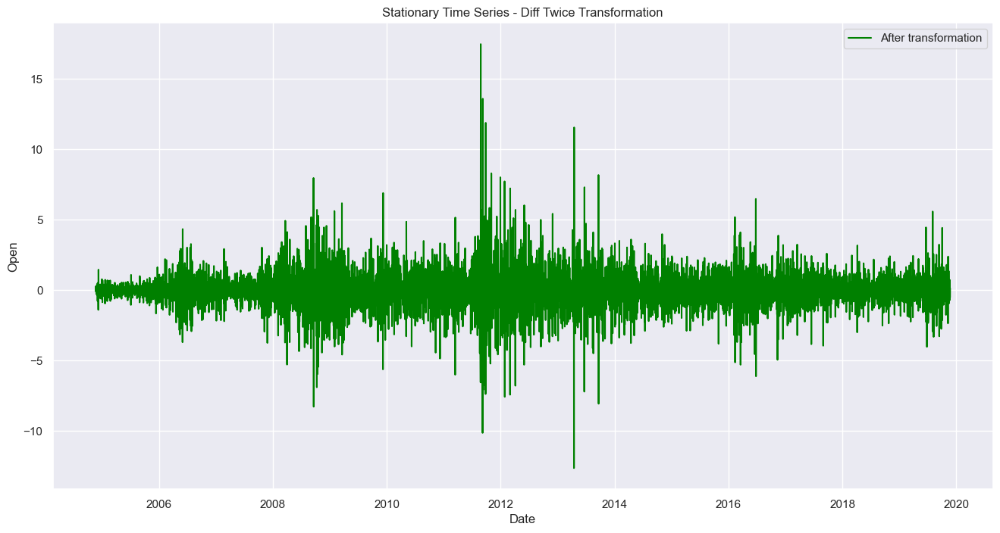

In [16]:
# Plot the time series before transformation
plt.figure(figsize=(16,8))
sns.lineplot(x=data.index, y='Open', data=data, linewidth=1.5, label='Before transformation').set_title('Time Series - Before Transformation')
plt.show()

# Plot the time series after transformation
plt.figure(figsize=(16,8))
sns.lineplot(x=data_difftwice.index, y='Open', data=data_difftwice, label='After transformation', color='green').set_title('Stationary Time Series - Diff Twice Transformation')
plt.show()

# Which Model - AR, MA or ARMA. Use ACF and PACF to Choose the Model Order

**ACF** - Autocorrelation function to help select the right order.

**PACF** - Partial Autocorrelation is the correlation between the time series and the lag version of itself after we subtract the effect of correlation at smaller lags.So, it’s just the correlation associated with just that particular lag

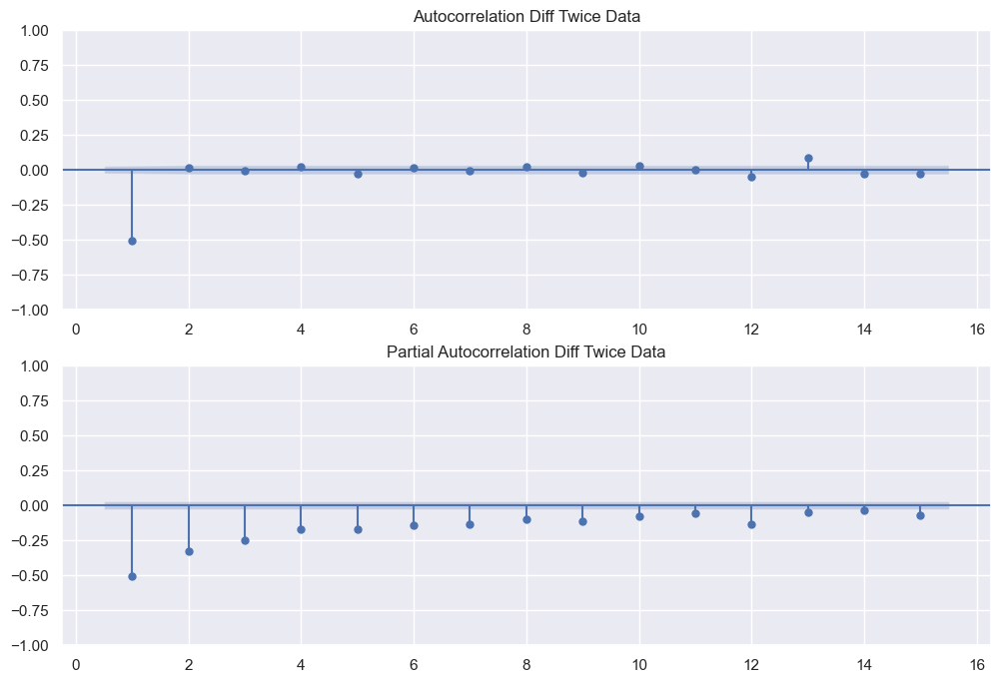

In [17]:
# Plot ACF and PACF with stationary data using data that was differenced twice

fig_difftwice, (ax1, ax2) = plt.subplots(2,1, figsize=(12,8))

# Plot ACF of data_difftwice
plot_acf(data_difftwice['Open'], lags=15, zero=False, ax=ax1, title='Autocorrelation Diff Twice Data')

# Plot PACF of data_difftwice
plot_pacf(data_difftwice['Open'], lags=15, zero=False, ax=ax2, title='Partial Autocorrelation Diff Twice Data')

plt.show()

### Initial Observation
**ACF** - Cuts off after lag 1

**PACF** - tails off

**Initial conclusion:** It may be a MA(1) model.

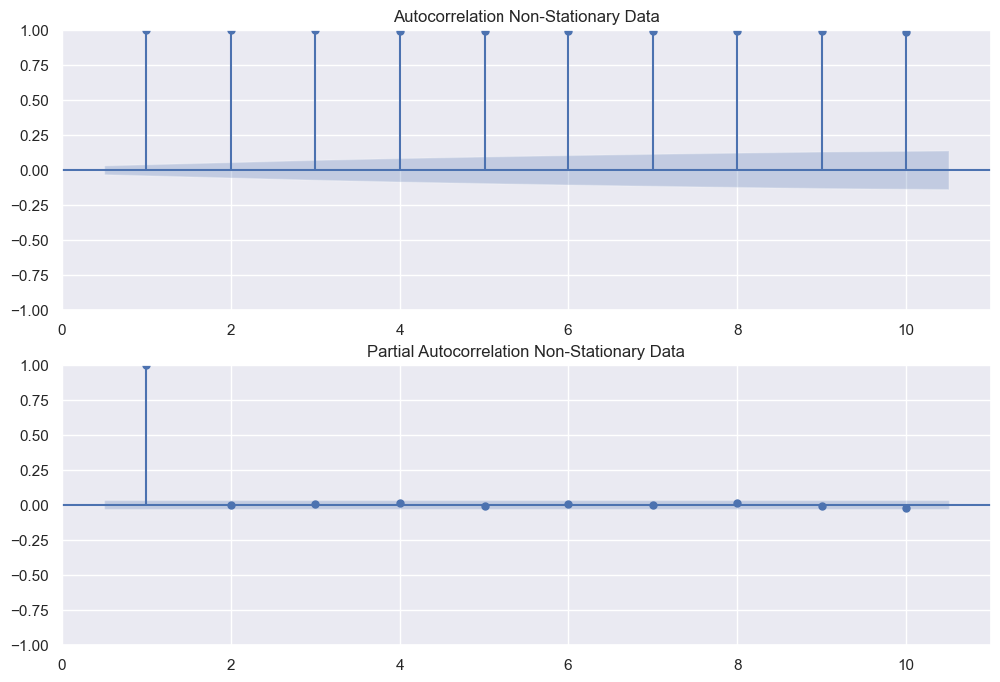

In [18]:
# Plot ACF and PACF with non-stationary data just to see how different they are compared to the stationary data

fig_data_gld, (ax1, ax2) = plt.subplots(2,1, figsize=(12,8))

# Plot ACF of data_difftwice
plot_acf(data_gld['Open'], lags=10, zero=False, ax=ax1, title='Autocorrelation Non-Stationary Data')

# Plot PACF of data_difftwice
plot_pacf(data_gld['Open'], lags=10, zero=False, ax=ax2, title='Partial Autocorrelation Non-Stationary Data')

plt.show()

# Conclusion
The **ACF** cuts off after lag 1 and the **PACF** tails off. This may indicate that a Moving Average Model with an order of 1 MA(1) might be the best. However, there are limitations to the ACF and PACF method. We are making the judgement based on how the ACF and PACF graphs look. Sometimes it may not be as clear to make a conclusion. 

Next, let's use a different method to pick the optimal model order - the AIC and BIC.

# Which Model - AR, MA or ARMA. Use AIC and BIC Results to Pick the Optimal Model Order

**Akaike Information Criterion (AIC)**
- Lower AIC indicates a better model
- AIC is ideal for simple models with lower order


**Bayesian Information Criterion (BIC)**
- Lower BIC indicates a better model
- BIC penalizes complex models

Most of the times, AIC and BIC will select the same model order. However, when they don't, we have to make a choice which to pick:
- AIC - better at choosing predictive models (use this if that’s our goal)
- BIC - better at choosing good explanatory model (use this if that’s our goal)



In [19]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Search for the ideal model order
order_aic_bic = []

# Loop over AR order
for p in range(3):
    # Loop over MA order
    for q in range(3):
        try:
            # Fit model
            model = ARIMA(data_difftwice['Open'], order=(p, 0, q))
            results = model.fit()
            # Store the model order and the AIC/BIC values in order_aic_bic list
            order_aic_bic.append((p, q, results.aic, results.bic))
        except:
            # Print AIC and BIC as None when fails
            print(p, q, None, None)

# Create a DataFrame from the results
aic_bic_df = pd.DataFrame(order_aic_bic, columns=['p', 'q', 'aic', 'bic'])




In [20]:
sorted_aic_df = aic_bic_df.sort_values('aic')
sorted_bic_df = aic_bic_df.sort_values('bic')

print("Sorted by AIC and BIC:")
print(sorted_aic_df)


Sorted by AIC and BIC:
   p  q           aic           bic
1  0  1  15871.795081  15891.622209
4  1  1  15873.630678  15900.066849
2  0  2  15873.677617  15900.113788
7  2  1  15874.996075  15908.041289
5  1  2  15875.629821  15908.675035
8  2  2  15878.154202  15917.808459
6  2  0  17421.185258  17447.621429
3  1  0  18055.677635  18075.504763
0  0  0  19685.644070  19698.862155


# Conclusion: Both AIC and BIC selected the same p and q values of 0, 1.
This is the same results as the ACF and PACF analysis where we determined it was a MA(1) model order.

# Train-test Split
There are 15 years of data. We are going to use the first 12 years (2004 - 2016) as training data and the last 3 years (2017 - 2019) as test data.

In [21]:
train_data = data.loc[:'2016']
test_data = data.loc['2017':]

In [22]:
# Look at train data
train_data.shape

(4427, 6)

In [23]:
# Checking to make sure the data ends in 2016
train_data.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2016-12-27,108.610001,108.669998,108.239998,108.559998,108.559998,3685500
2016-12-28,108.400002,108.910004,108.290001,108.860001,108.860001,5091200
2016-12-29,109.230003,110.529999,109.160004,110.290001,110.290001,7563900
2016-12-30,110.379997,110.620003,109.529999,109.610001,109.610001,8873700
2016-12-31,110.379997,110.620003,109.529999,109.610001,109.610001,8873700


In [24]:
# Look at test data
test_data.shape

(1056, 6)

In [25]:
# Check to see the data starts in 2017
test_data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-01-01,110.379997,110.620003,109.529999,109.610001,109.610001,8873700
2017-01-02,110.379997,110.620003,109.529999,109.610001,109.610001,8873700
2017-01-03,109.620003,111.000000,109.370003,110.470001,110.470001,7527400
2017-01-04,111.059998,111.220001,110.610001,110.860001,110.860001,4904100
2017-01-05,112.160004,112.940002,112.070000,112.580002,112.580002,9606800


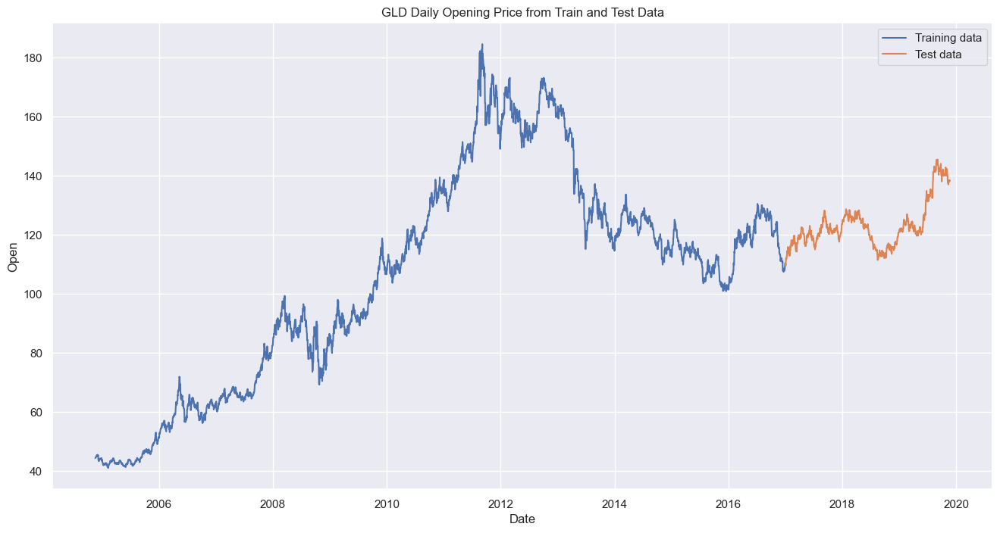

In [26]:
# Plot the test and train data
plt.figure(figsize=(16,8))
sns.lineplot(x=train_data.index, y='Open', data=train_data, linewidth=1.5, label='Training data').set_title('GLD Daily Opening Price from Train and Test Data')
sns.lineplot(x=test_data.index, y='Open', data=test_data, linewidth=1.5, label='Test data')
plt.show()

# Method 1: ARIMA Model with No Seasonality & One-Step Ahead Forecast

# Fit the Model With These Parameters
We start by comparing predicted values to real values of the time series, which will help us understand the accuracy of our forecasts.

When we forecast differenced time series, we end up with forecasted data of the difference. We have to use the difference to reverse engineer in order to derive the forecasted price. However, we can use ARIMA model to avoid all the work! It takes care of the reverse engineering part automatically!

### ARIMA Model - Autoregressive Integrated Moving Average
model = SARIMAX(df, order = (p,d,q))
- p = number of autoregressive lags
- d = order of differencing
- q = number of moving average lags

Based on previous findings, the order = (p,d,q) should be:
- Difference = 2
- p = 0
- q = 1

When using ARIMA, the forecasted data is the actual forecated price, not the difference.

In [27]:
# Fit an ARIMA model
model = ARIMA(train_data['Open'], order=(0, 2, 1), trend= None)
results = model.fit()

# Make predictions for the last 365 days of the train data
# dynamic=False ensures we produce one-step ahead forecasts, forecasts at each point are generated using the full history up to that point
# start=-365, we want to start the prediction from one year back (365 days)
pred_365_traindata = results.get_prediction(start=-365, dynamic=False)

# Forecast mean for these 365 days
pred_mean_365_traindata = pred_365_traindata.predicted_mean

# Get confidence intervals of forecast
confidence_intervals = pred_365_traindata.conf_int()

# Select lower and upper confidence limits
lower_limits = confidence_intervals.loc[:, 'lower Open']
upper_limits = confidence_intervals.loc[:, 'upper Open']


In [28]:
print(pred_mean_365_traindata)

2016-01-02    101.472616
2016-01-03    101.472621
2016-01-04    101.472626
2016-01-05    103.123727
2016-01-06    103.123731
                 ...    
2016-12-27    107.835884
2016-12-28    108.606404
2016-12-29    108.396268
2016-12-30    109.226824
2016-12-31    110.377585
Freq: D, Name: predicted_mean, Length: 365, dtype: float64


In [29]:
# Convert pred_mean_365_traindata series to a dataframe
# Inspect pred_mean_365_traindata_df
pred_mean_365_traindata_df = pred_mean_365_traindata.to_frame(name='forecasted_mean')
pred_mean_365_traindata_df.head()

,forecasted_mean
2016-01-02,101.472616
2016-01-03,101.472621
2016-01-04,101.472626
2016-01-05,103.123727
2016-01-06,103.123731


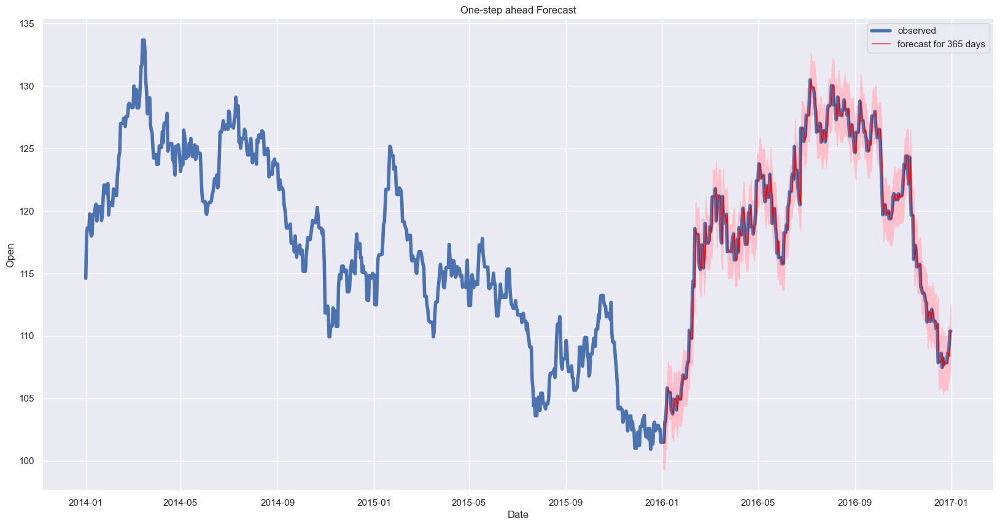

In [30]:
# Plot the original training data - Zoom in starting from 2014
plt.figure(figsize=(20,10))
sns.lineplot(x=train_data['2014-01-01 00:00:00':].index, y='Open', data=train_data['2014-01-01 00:00:00':], linewidth=4, label='observed').set_title('One-step ahead Forecast')

# Plot the mean predictions for the last 365 days of training data
sns.lineplot(x=pred_mean_365_traindata_df.index, y=pred_mean_365_traindata_df['forecasted_mean'], data=pred_mean_365_traindata_df, linewidth=1, label='forecast for 365 days', color='red')

# Shade the area between the confidence intervals
plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')


Overall, the above forecasts align with the true values very well for the last 365 days of the training data and it falls within the confidence intervals.

# Method 1: Model Diagnostics
Evaluate the quality of the model before using it for forecasting in production.

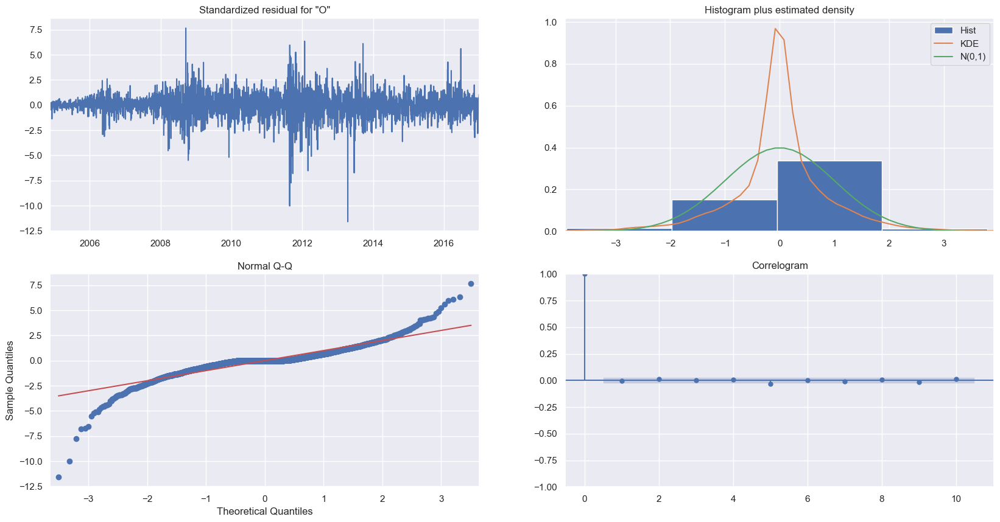

In [31]:
# Create the 4 diagnostic plots
results.plot_diagnostics()
plt.show()

In [32]:
print(results.summary())

                               SARIMAX Results                                
Dep. Variable:                   Open   No. Observations:                 4427
Model:                 ARIMA(0, 2, 1)   Log Likelihood               -6675.533
Date:                Tue, 09 Jan 2024   AIC                          13355.066
Time:                        18:57:09   BIC                          13367.856
Sample:                    11-18-2004   HQIC                         13359.577
                         - 12-31-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9993      0.001  -1266.727      0.000      -1.001      -0.998
sigma2         1.1946      0.009    129.239      0.000       1.176       1.213
Ljung-Box (L1) (Q):                   0.08   Jarque-

# MAE, MSE, RMSE Calculations

- **Mean Absolute Error** - Measures the average magnitude of the errors in a set of forecasts, without considering their direction. It measures accuracy for continuous variables. Lower values are better, 0 is best.

- **Mean Squared Error (MSE)** - the average squared difference between the estimated values and what is estimated. Measures the quality of an estimator. Smaller the MSE, the closer we are finding the line of best fit.

- **Root Mean Square Error (RMSE)** - similar to MSE, however, the average squared difference between the estimated values and what is estimated. 

In [33]:
# Calculate Mean Absolute Error Between the Predicted Open Prices and the Real Open Prices
residuals = results.resid
mae = np.mean(np.abs(residuals))
print('The Mean Absolute Error of our forecasts is {}'.format(round(mae, 2)))

# Calculate Mean Square Error for periods 2015-08-05 to 2016-12-30 (last 365 days of training data)
pred_mean_365_traindata = pred_365_traindata.predicted_mean
real_values = train_data['2016-01-02':'2016-12-31']['Open']
mse = ((pred_mean_365_traindata - real_values) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

# Calculate Root Mean Squared Error
rmse = np.sqrt(mse)
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Mean Absolute Error of our forecasts is 0.64
The Mean Squared Error of our forecasts is 1.04
The Root Mean Squared Error of our forecasts is 1.02


In [34]:
# Shortcut - Use sklearn metrics library to calculate these metrics.
print('MAE: {}'.format(mean_absolute_error(real_values, pred_mean_365_traindata)))
print('MSE: {}'.format(mean_squared_error(real_values, pred_mean_365_traindata)))
print('RMSE: {}'.format(np.sqrt(mean_squared_error(real_values, pred_mean_365_traindata))))

MAE: 0.6287232633439713
MSE: 1.042684217182507
RMSE: 1.0211191003905995


# Method 1 Conclusion: ARIMA Model with No Seasonality & One-Step Ahead Forecast

# Analysis of Diagnostic Results

### Real vs Forecated Value Plot
- the predicted values are align with the real values and the predicted values fall within the confidence interval


### Analysis from the 4 Diagnostic Plots
- **Standardized Residual Plot** - The graph doesn't seem to show a trend. That's what we want.
- **Historgram Plus Estimated Density** - This shows the distribution of the residuals. The green line shows a normal distribution and the orange line needs to be as close to the green line. The 2 lines are very different in this case. This model might need tweaking. 
- **Normal Q-Q** - This shows how the distribution of the residuals compares to a normal distribution. Most of the residuals are on the line except the ends.
- **Correlogram** - ACF plot of the residuals. 95% of the data where lag > 0 should not be significant. That means, they need to be within the blue shaded area. Based on the graph, it looks OK as 95% of the data is not significant, they are within the blue shaded area. 

### Analysis from Summary Results
- Ljung-Box - the null hypothesis states there are no correlations in the residual. If Prob(Q) <= 0.05, then we have to reject the null hypothesis and refit the model. In this case, it's 0.
- Jarque-Bera - the null hypothesis states the residual are normally distributed. If Prob(JB) <= 0.05, then we have to reject the null hypothesis and refit the model. In this case, it's 0.

### MAE, MSE, RMSE (use scklearn metrics)
- MAE: 0.64
- MSE: 1.04
- RMSE: 1.02 - our model forecasted the average daily open price in the training set is within \\$1.02 of the real open prices. \$1 variance in stock price can be considered large.

### In Conclusion:
The analysis above shows that the residuals are correlated and they are not normally distrbuted. This means there is data that the model didn't capture. We need to refit the model. **We may not be able to use this model to make forecasts**.

# Seasonal Time Series
In the previous model, seasonality was not taken into account. Here's we'll investigate if the data is seasonal.

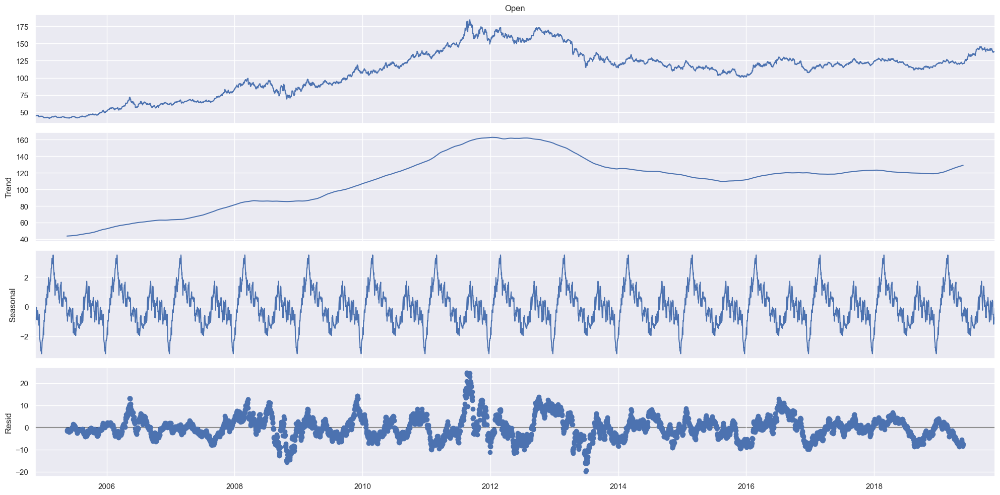

In [35]:
# Use seasonal_decompose to check for seasonal time series
# Additive = Level + Trend + Seasonality + Noise
# Used freq = 365 to represent 365 days in a year

# Had to run this line of code because encountered this error - TypeError: float() argument must be a string or a number, not Period
# This is the solution - Re-registering Pandas converters with"
pd.plotting.register_matplotlib_converters()

decomp_results = seasonal_decompose(data['Open'], model='additive', period=365)

# Visualize the data using time-series decomposition
decomp_results.plot()
plt.show()

The plots above shows that the trend in prices of gold is not consistent but there is some obvious seasonality.

# Fitting a SARIMA model with seasonal data

model = SARIMAX(df, order=(p,d,q), seasonal_order(P,D,Q,S))

**Non-seasonal order**
- p: autoregressive order
- d: differencing order
- q: moving average order

**Seasonal order**
- P: seasonal autoregressive order
- D: seasonal differencing order
- Q: seasonal moving average order
- S: number of time steps per cycle

# Method 2:  Auto ARIMA Model with Seasonality & One-Step Ahead Forecast

In [36]:
# In order to use Auto Arima (it's like an automatic grid search to discover the optimal order for an ARIMA model), data needs to be univariate series. We only need 1 column. 
# Source: http://www.alkaline-ml.com/pmdarima/0.9.0/modules/generated/pyramid.arima.auto_arima.html
arima_data = data.drop(columns=['High', 'Low', 'Close', 'Adj Close', 'Volume'])
arima_data.head()

,Open
Date,
2004-11-18,44.430000
2004-11-19,44.490002
2004-11-20,44.490002
2004-11-21,44.490002
2004-11-22,44.750000


In [37]:
results = auto_arima(arima_data,
                    seasonal=False,
                    start_p=1,
                    start_q=1,
                    max_p=4,
                    max_q=4,
                    information_criterion='aic',
                    trace=True,
                    stepwise=True)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=15867.129, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=15863.338, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=15865.223, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=15865.225, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=15862.861, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.742 seconds


### Best Fit ARIMA
Based on the lowest AIC score, the Best Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 0, 0, 7). Auto Arima didn't detect any seasonality and suggested the differencing is ONLY ONCE and not TWICE which we concluded earlier using the Dicky-Fuller test.

In [38]:
print(results.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 5483
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -7930.430
Date:                Tue, 09 Jan 2024   AIC                          15862.861
Time:                        18:57:12   BIC                          15869.470
Sample:                    11-18-2004   HQIC                         15865.167
                         - 11-22-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         1.0569      0.007    148.171      0.000       1.043       1.071
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):             45705.63
Prob(Q):                              0.73   Pr

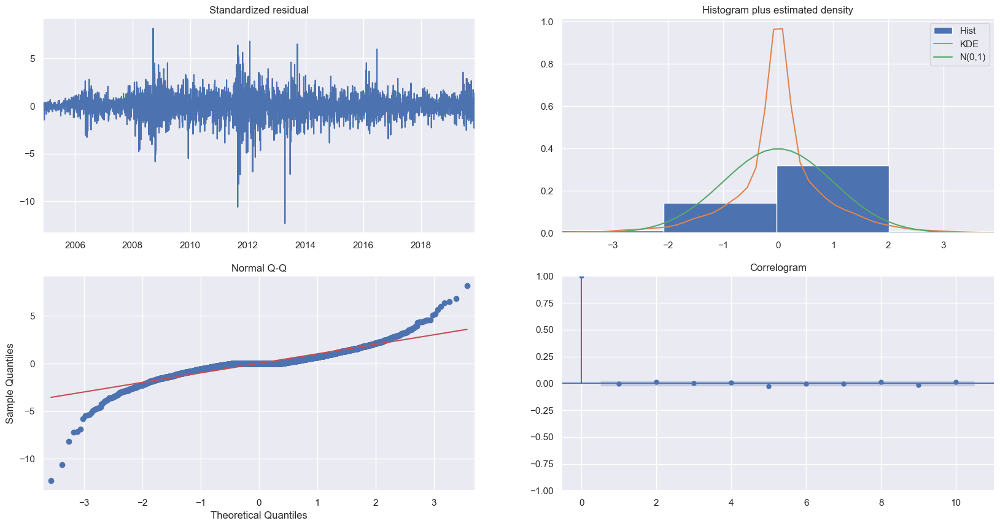

In [39]:
results.plot_diagnostics()
plt.show()

In [40]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming 'arima_data' is your time series data
# Split data into training and test sets
arima_train_data = arima_data.loc[:'2016']
arima_test_data = arima_data.loc['2017':]

# Create an ARIMA model
arima_model = SARIMAX(arima_train_data,
                      order=(0, 1, 0),  # Adjust non-seasonal order (p, d, q) as needed
                      trend='c')

# Fit the ARIMA model
arima_results = arima_model.fit()

# Make predictions for the last 365 days of the train data
# dynamic=False ensures we produce one-step ahead forecasts, forecasts at each point are generated using the full history up to that point
# start=-365, we want to start the prediction from one year back (365 days)
arima_pred_365_traindata = arima_results.get_prediction(start=-365, dynamic=False)

# Forecast mean for 365 days
arima_pred_mean_365_traindata = arima_pred_365_traindata.predicted_mean

# Get confidence intervals of forecast
arima_confidence_intervals = arima_pred_365_traindata.conf_int()

# Select lower and upper confidence limits
arima_lower_limits = arima_confidence_intervals.loc[:, 'lower Open']
arima_upper_limits = arima_confidence_intervals.loc[:, 'upper Open']

# Convert arima_pred_mean_365_traindata series to a dataframe
# Inspect arima_pred_mean_365_traindata_df
arima_pred_mean_365_traindata_df = arima_pred_mean_365_traindata.to_frame(name='forecasted_mean')
arima_pred_mean_365_traindata_df.head()




,forecasted_mean
2016-01-02,101.494904
2016-01-03,101.494904
2016-01-04,101.494904
2016-01-05,103.144898
2016-01-06,103.144898


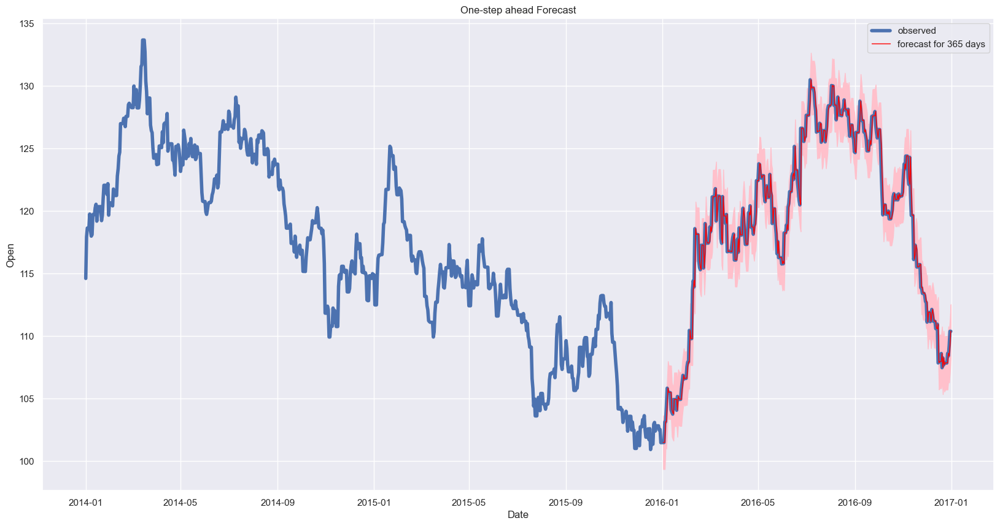

In [41]:
# Plot the origin training data - Zoom in starting from 2014
plt.figure(figsize=(20,10))
sns.lineplot(x=train_data['2014-01-01 00:00:00':].index, y='Open', data=train_data['2014-01-01 00:00:00':], linewidth=4, label='observed').set_title('One-step ahead Forecast')

# Plot the mean predictions
sns.lineplot(x=arima_pred_mean_365_traindata_df.index, y=arima_pred_mean_365_traindata_df['forecasted_mean'], data=arima_pred_mean_365_traindata_df, linewidth=1, label='forecast for 365 days', color='red')

# Shade the area between the confidence intervals
plt.fill_between(arima_lower_limits.index, arima_lower_limits, arima_upper_limits, color='pink')

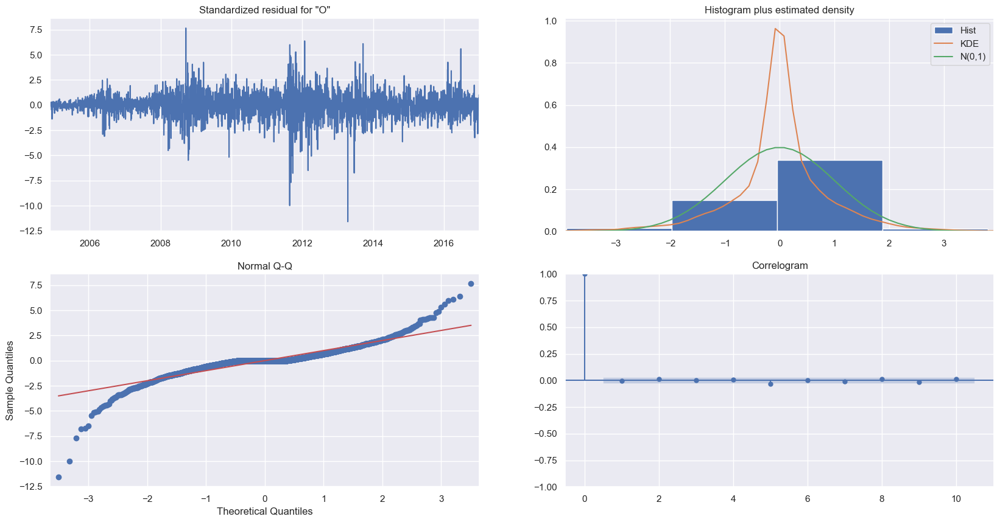

                               SARIMAX Results                                
Dep. Variable:                   Open   No. Observations:                 4427
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -6672.507
Date:                Tue, 09 Jan 2024   AIC                          13349.014
Time:                        18:57:15   BIC                          13361.804
Sample:                    11-18-2004   HQIC                         13353.524
                         - 12-31-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0149      0.017      0.890      0.373      -0.018       0.048
sigma2         1.1939      0.009    127.785      0.000       1.176       1.212
Ljung-Box (L1) (Q):                   0.07   Jarque-

In [42]:
# Create the 4 diagnostic plots
arima_results.plot_diagnostics()
plt.show()

# Print the diagnostic summary results
print(arima_results.summary())

# Calculate MAE, MSE, RMSE
print('MAE: {}'.format(mean_absolute_error(real_values, arima_pred_mean_365_traindata_df)))
print('MSE: {}'.format(mean_squared_error(real_values, arima_pred_mean_365_traindata_df)))
print('RMSE: {}'.format(np.sqrt(mean_squared_error(real_values, arima_pred_mean_365_traindata_df))))

# Forecast using Training Data and Compare with the Test Data

In [43]:
# Forecasting out of the sample. Use 1056 because that's how many days there are in the test set
auto_arima_forecast = arima_results.get_forecast(steps=len(test_data))

# Forecast mean
auto_arima_mean_forecast = auto_arima_forecast.predicted_mean

# Get confidence intervals of forecast
# Assign it the same index at test data
auto_arima_forecasted_confidence_intervals = auto_arima_forecast.conf_int()
auto_arima_forecasted_confidence_intervals.index = test_data.index #need to do this in order to plot


# Select lower and upper confidence limits
auto_arima_forecasted_lower_limits = auto_arima_forecasted_confidence_intervals.loc[:,'lower Open']
auto_arima_forecasted_upper_limits = auto_arima_forecasted_confidence_intervals.loc[:,'upper Open']

# Convert auto_arima_mean_forecast to a dataframe
# Inspect auto_arima_mean_forecast
auto_arima_mean_forecast_df = auto_arima_mean_forecast.to_frame(name='forecasted_mean')
auto_arima_mean_forecast_df.index = test_data.index
auto_arima_mean_forecast_df.head()

,forecasted_mean
Date,
2017-01-01,110.394898
2017-01-02,110.409798
2017-01-03,110.424699
2017-01-04,110.439599
2017-01-05,110.454500


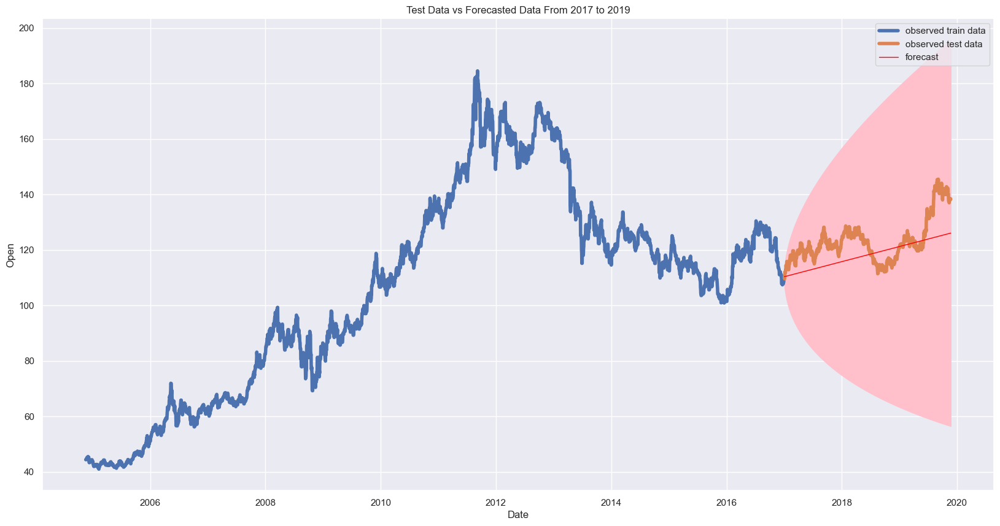

In [44]:
# Plot the forecasted data set against the test data
plt.figure(figsize=(20,10))

# Plot the train data
sns.lineplot(x=train_data.index, y='Open', data=train_data, linewidth=4, label='observed train data').set_title('Test Data vs Forecasted Data From 2017 to 2019')

# Plot the test data
sns.lineplot(x=test_data.index, y='Open', data=test_data, linewidth=4, label='observed test data')

# Plot the forecast data
sns.lineplot(x=auto_arima_mean_forecast_df.index, y=auto_arima_mean_forecast_df['forecasted_mean'], data=auto_arima_mean_forecast_df, linewidth=1, label='forecast', color='red')

# Shade the area between the confidence intervals
plt.fill_between(auto_arima_forecasted_lower_limits.index, auto_arima_forecasted_lower_limits, auto_arima_forecasted_upper_limits, color='pink')

In [45]:
# Calculate MAE, MSE, RMSE
real_test_values = test_data['Open']

# Calculate MAE, MSE, RMSE
print('MAE: {}'.format(mean_absolute_error(real_test_values, auto_arima_mean_forecast)))
print('MSE: {}'.format(mean_squared_error(real_test_values, auto_arima_mean_forecast)))
print('RMSE: {}'.format(np.sqrt(mean_squared_error(real_test_values, auto_arima_mean_forecast))))

MAE: 6.698035408810689
MSE: 64.35850259347345
RMSE: 8.022375121712612


# ARIMA Conclusion
By looking at the plot, the forecasted data showed an upward trend which is aligned with the test data. It correctly predicted that Gold Prices will go up from 2017 - 2019. It is also within the confidence interval, however the interval is really large. It's hard to predict the prices of gold but it's able to predict a general trend over time.

# Facebook Prophet
Make sure to install Pystan (pre-requisite) and Prophet. Follow these installation instructions:
- https://pystan.readthedocs.io/en/latest/installation_beginner.html
- https://facebook.github.io/prophet/docs/installation.html

Good resource
- https://facebook.github.io/prophet/docs/quick_start.html#python-api

In [46]:
# For Prophet, we need to create a dataset that is a univariate time series that contains only Open Price. Drop all other columns.
pf_data = data.drop(['High', 'Low', 'Close', 'Adj Close', 'Volume'], axis=1)

#Prophet requires 2 columns with variable names in the time series to be:
#y – Target
#ds – Datetime
pf_data.rename(columns={'Open':'y'}, inplace=True)
pf_data['ds'] = pf_data.index

#Create train and test data sets
pf_train_data = pf_data.loc[:'2016']
pf_test_data = pf_data.loc['2017':]

# Fitting the prophet model
#pf_model = Prophet(changepoint_prior_scale=0.1, daily_seasonality=True)
pf_model = Prophet(daily_seasonality=True)
pf_model.fit(pf_train_data)

#Create future prices & predict prices
pf_future_prices = pf_model.make_future_dataframe(periods=len(pf_test_data)) #1056 days from 1/1/2017 - 11/22/2019, data in the test set 
pf_forecast = pf_model.predict(pf_future_prices)

18:57:18 - cmdstanpy - INFO - Chain [1] start processing
18:57:20 - cmdstanpy - INFO - Chain [1] done processing


In [47]:
# Forecast out 1056 days from training data because that's how many days of data we have in the test set
pf_forecast[-(len(pf_test_data)):]

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4427,2017-01-01,116.807979,106.729940,119.576183,116.807979,116.807979,-3.819740,-3.819740,-3.819740,-0.469498,...,-0.040495,-0.040495,-0.040495,-3.309747,-3.309747,-3.309747,0.0,0.0,0.0,112.988239
4428,2017-01-02,116.807708,107.055999,119.650503,116.807708,116.807708,-3.599102,-3.599102,-3.599102,-0.469498,...,0.048050,0.048050,0.048050,-3.177654,-3.177654,-3.177654,0.0,0.0,0.0,113.208606
4429,2017-01-03,116.807437,106.516776,120.242224,116.807437,116.807437,-3.473980,-3.473980,-3.473980,-0.469498,...,0.026720,0.026720,0.026720,-3.031202,-3.031202,-3.031202,0.0,0.0,0.0,113.333457
4430,2017-01-04,116.807167,106.461848,119.612998,116.807167,116.807167,-3.311558,-3.311558,-3.311558,-0.469498,...,0.030585,0.030585,0.030585,-2.872644,-2.872644,-2.872644,0.0,0.0,0.0,113.495609
4431,2017-01-05,116.806896,107.110078,120.021181,116.806896,116.806896,-3.196739,-3.196739,-3.196739,-0.469498,...,-0.022843,-0.022843,-0.022843,-2.704397,-2.704397,-2.704397,0.0,0.0,0.0,113.610157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5478,2019-11-18,116.523470,-15.901212,240.625185,-14.461918,240.264785,-1.284963,-1.284963,-1.284963,-0.469498,...,0.048050,0.048050,0.048050,-0.863515,-0.863515,-0.863515,0.0,0.0,0.0,115.238506
5479,2019-11-19,116.523199,-12.886065,239.135594,-14.651293,240.396124,-1.310626,-1.310626,-1.310626,-0.469498,...,0.026720,0.026720,0.026720,-0.867848,-0.867848,-0.867848,0.0,0.0,0.0,115.212573
5480,2019-11-20,116.522928,-16.022276,239.974119,-14.840668,240.527464,-1.307636,-1.307636,-1.307636,-0.469498,...,0.030585,0.030585,0.030585,-0.868722,-0.868722,-0.868722,0.0,0.0,0.0,115.215293
5481,2019-11-21,116.522658,-16.625458,239.299968,-15.030043,240.658803,-1.359163,-1.359163,-1.359163,-0.469498,...,-0.022843,-0.022843,-0.022843,-0.866821,-0.866821,-0.866821,0.0,0.0,0.0,115.163495


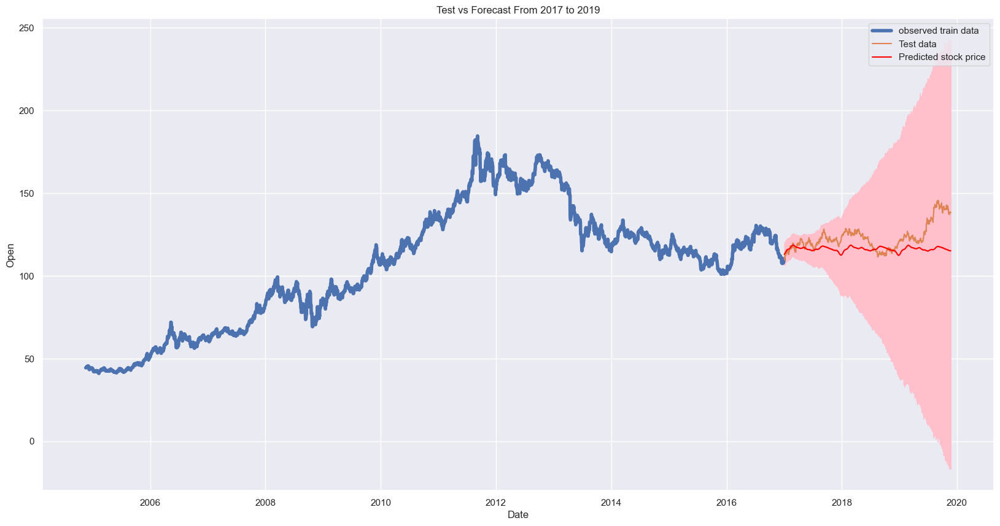

In [48]:
# Plot the forecasted data set against the test data
plt.figure(figsize=(20,10))

# Plot the train data
sns.lineplot(x=train_data.index, y='Open', data=train_data, linewidth=4, label='observed train data').set_title('Test vs Forecast From 2017 to 2019')
sns.lineplot(x=test_data.index, y='Open', data=test_data, linewidth=1.5, label='Test data')
sns.lineplot(x=test_data.index, y=pf_forecast['yhat'][-(len(pf_test_data)):], color='red', label='Predicted stock price')
plt.fill_between(test_data.index, pf_forecast['yhat_lower'][-(len(pf_test_data)):], pf_forecast['yhat_upper'][-(len(pf_test_data)):], color='pink')
plt.show()

In [49]:
# Calculate MAE, MSE, RMSE
real_test_values = test_data['Open']

# Calculate MAE, MSE, RMSE
print('MAE: {}'.format(mean_absolute_error(real_test_values, pf_forecast['yhat'][-(len(pf_test_data)):])))
print('MSE: {}'.format(mean_squared_error(real_test_values, pf_forecast['yhat'][-(len(pf_test_data)):])))
print('RMSE: {}'.format(np.sqrt(mean_squared_error(real_test_values, pf_forecast['yhat'][-(len(pf_test_data)):]))))

MAE: 7.662491884669888
MSE: 107.50223359113787
RMSE: 10.368328389433751


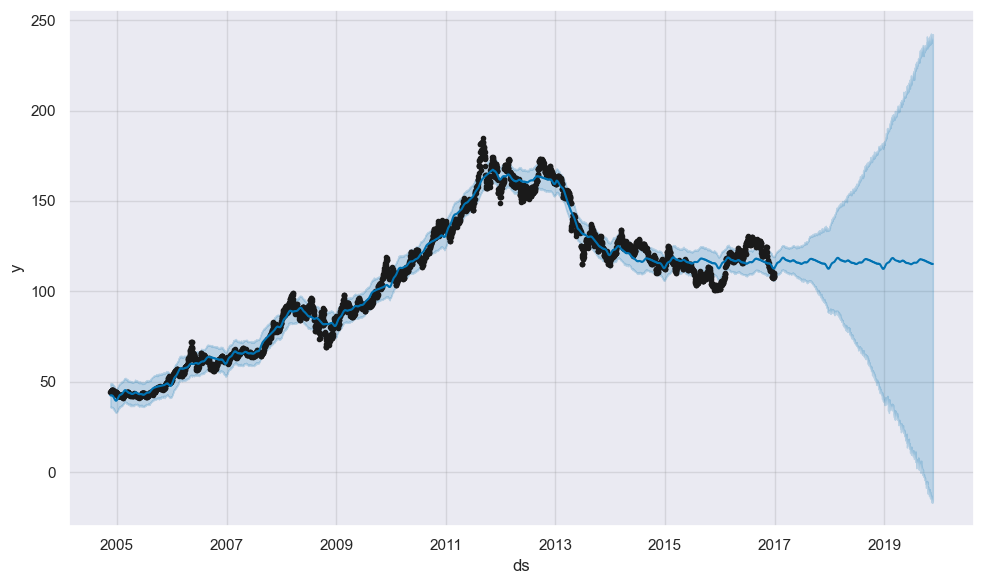

In [50]:
fig1 = pf_model.plot(pf_forecast)

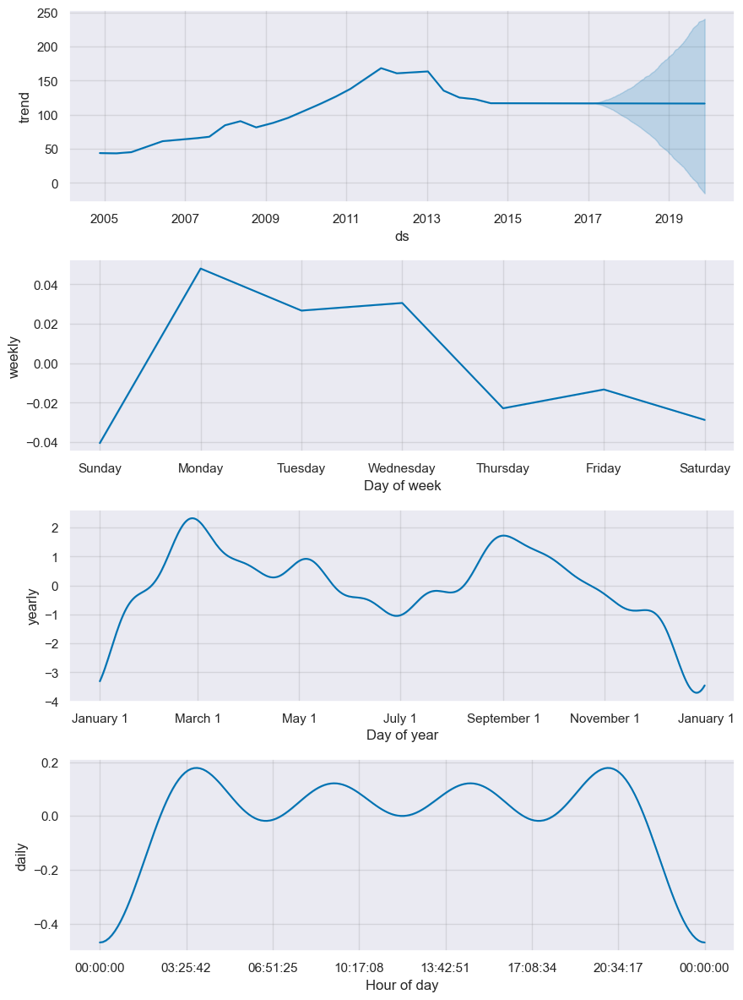

In [51]:
fig2 = pf_model.plot_components(pf_forecast)

In [52]:
abc = pd.read_csv('GLD.csv')
df = abc.drop(columns=['High', 'Low', 'Close', 'Adj Close', 'Volume'])

In [53]:
from prophet.plot import plot_plotly
import plotly.graph_objects as go
from prophet.plot import plot_plotly
# Create a DataFrame for future dates




df_prophet = df[['Date', 'Open']]
df_prophet.columns = ['ds', 'y']

# Create and fit the Prophet model
prophet_model = Prophet()
prophet_model.fit(df_prophet)
future = prophet_model.make_future_dataframe(periods=365)  # Adjust the number of periods as needed

# Generate forecast
prophet_forecast = prophet_model.predict(future)

# Plot the forecast using Plotly
fig = go.Figure()

# Original data
fig.add_trace(go.Scatter(x=df_prophet['ds'], y=df_prophet['y'], mode='lines', name='Actual'))

# Forecast
fig.add_trace(go.Scatter(x=prophet_forecast['ds'], y=prophet_forecast['yhat'], mode='lines', name='Forecast'))

# Upper and lower bounds
fig.add_trace(go.Scatter(x=prophet_forecast['ds'], y=prophet_forecast['yhat_upper'], fill=None, mode='lines', line=dict(color='gray'), name='Upper Bound'))
fig.add_trace(go.Scatter(x=prophet_forecast['ds'], y=prophet_forecast['yhat_lower'], fill='tonexty', mode='lines', line=dict(color='gray'), name='Lower Bound'))

# Customize layout if needed
fig.update_layout(title='Prophet Forecast with Plotly',
                  xaxis_title='Date',
                  yaxis_title='Value')

# Show the plot
fig.show()



18:57:25 - cmdstanpy - INFO - Chain [1] start processing
18:57:27 - cmdstanpy - INFO - Chain [1] done processing


# Prophet Conclusion
By looking at the above plots produced by Prophet, the forecasted data shows a flat line. The forecasted data is not aligned with the test data when the test data shows an upward trend. Prophet does not seem to be as accurate as ARIMA model. The MAE, MSE and RMSE of Prophet is also higher than the results of ARIMA model.


# Forecast The Price of Gold For The Next 2 Years
- Having validated our forecast results with our test data, we are going to perform an out of sample forecasting. We have data of gold prices up till 11/22/2019. We are going to forecast the price of gold for the next 2 years, utilizing all the data we have.

# Using Auto Arima to Forecast 2 Years Out

In [54]:
# Assuming 'arima_data' is your time series data
# Use all the data in the dataset
arima_model = SARIMAX(arima_data,
                      order=(0, 1, 0),  # Adjust non-seasonal order (p, d, q) as needed
                      trend='c')

# Fit the ARIMA model
arima_results = arima_model.fit()

# Number of days to forecast
forecast_days = 365 * 2

# Forecasting out of the sample for the specified number of days
arima_forecast = arima_results.get_forecast(steps=forecast_days)

# Forecast mean
arima_mean_forecast = arima_forecast.predicted_mean

# Convert arima_mean_forecast to a DataFrame
arima_mean_forecast_df = arima_mean_forecast.to_frame(name='forecasted_mean')

# Get confidence intervals of forecast
arima_forecasted_confidence_intervals = arima_forecast.conf_int()
arima_forecasted_confidence_intervals.index = arima_mean_forecast_df.index  # Match the index of the mean forecast

# Select lower and upper confidence limits
arima_forecasted_lower_limits = arima_forecasted_confidence_intervals.loc[:, 'lower Open']
arima_forecasted_upper_limits = arima_forecasted_confidence_intervals.loc[:, 'upper Open']

arima_mean_forecast_df


,forecasted_mean
2019-11-23,138.387131
2019-11-24,138.404267
2019-11-25,138.421403
2019-11-26,138.438539
2019-11-27,138.455675
...,...
2021-11-17,150.810790
2021-11-18,150.827926
2021-11-19,150.845062
2021-11-20,150.862198


In [55]:
#Use arima prediction to predict prices for the entire time period of the data set and 2 years out. Entire period is 11/18/2004 - 11/21/2021
import datetime

# Assuming 'arima_mean_forecast_df' is your DataFrame
start_date = datetime.datetime.strptime("2004-11-18", "%Y-%m-%d")
end_date = datetime.datetime.strptime("2021-11-21", "%Y-%m-%d")

# Filter the DataFrame for the specified date range
all_prediction_df = arima_mean_forecast_df.loc[start_date:end_date]

# Display the tail of the resulting DataFrame
all_prediction_df.tail()


,forecasted_mean
2021-11-17,150.810790
2021-11-18,150.827926
2021-11-19,150.845062
2021-11-20,150.862198
2021-11-21,150.879334


<Axes: title={'center': 'Actual Data and 2 Year Forecasted Data'}, xlabel='Date', ylabel='Open'>

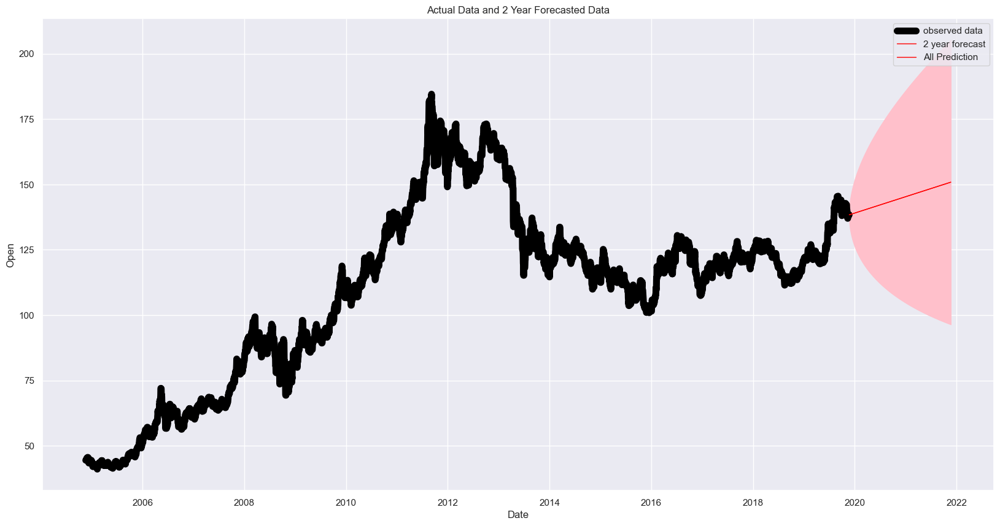

In [56]:
# Plot the original data set and forecasted data 
plt.figure(figsize=(20,10))

# Plot the train data
sns.lineplot(x=data.index, y='Open', data=data, linewidth=8, label='observed data', color='black').set_title('Actual Data and 2 Year Forecasted Data')


# Plot the forecast data
sns.lineplot(x=arima_mean_forecast_df.index, y=arima_mean_forecast_df['forecasted_mean'], data=arima_mean_forecast_df, linewidth=1, label='2 year forecast', color='red')

# Shade the area between the confidence intervals
plt.fill_between(arima_forecasted_lower_limits.index, arima_forecasted_lower_limits, arima_forecasted_upper_limits, color='pink')

# Plot all predictions
sns.lineplot(x=all_prediction_df.index, y=all_prediction_df['forecasted_mean'], data=all_prediction_df, linewidth=1, label='All Prediction', color='red')


### Auto Arima Forecast Results
- The 2 year forecast does does an upward trend in gold prices the next 2 years

# Using Prophet to Forecast 2 Years Out

In [57]:
# Fitting the prophet model
all_pf_model = Prophet(changepoint_prior_scale=0.1, daily_seasonality=True)
all_pf_model.fit(pf_data)

#Create future prices & predict prices
all_pf_future_prices = all_pf_model.make_future_dataframe(periods=forecast_days)  
all_pf_forecast = all_pf_model.predict(all_pf_future_prices)

18:57:31 - cmdstanpy - INFO - Chain [1] start processing
18:57:35 - cmdstanpy - INFO - Chain [1] done processing


In [58]:
all_pf_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2004-11-18,43.723865,38.697809,50.213328,43.723865,43.723865,0.499172,0.499172,0.499172,0.04196,...,-0.010271,-0.010271,-0.010271,0.467484,0.467484,0.467484,0.0,0.0,0.0,44.223037
1,2004-11-19,43.717023,38.763252,50.042287,43.717023,43.717023,0.482407,0.482407,0.482407,0.04196,...,0.002267,0.002267,0.002267,0.438181,0.438181,0.438181,0.0,0.0,0.0,44.199430
2,2004-11-20,43.710181,38.586588,49.617653,43.710181,43.710181,0.429053,0.429053,0.429053,0.04196,...,-0.023106,-0.023106,-0.023106,0.410199,0.410199,0.410199,0.0,0.0,0.0,44.139234
3,2004-11-21,43.703339,38.149871,49.792359,43.703339,43.703339,0.385808,0.385808,0.385808,0.04196,...,-0.039078,-0.039078,-0.039078,0.382926,0.382926,0.382926,0.0,0.0,0.0,44.089147
4,2004-11-22,43.696497,38.186112,50.048985,43.696497,43.696497,0.425830,0.425830,0.425830,0.04196,...,0.028230,0.028230,0.028230,0.355640,0.355640,0.355640,0.0,0.0,0.0,44.122327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6208,2021-11-17,139.711830,43.849095,236.341170,42.843838,235.646639,0.580832,0.580832,0.580832,0.04196,...,0.032166,0.032166,0.032166,0.506706,0.506706,0.506706,0.0,0.0,0.0,140.292663
6209,2021-11-18,139.724904,39.818018,236.166451,42.548497,235.832007,0.506765,0.506765,0.506765,0.04196,...,-0.010271,-0.010271,-0.010271,0.475076,0.475076,0.475076,0.0,0.0,0.0,140.231668
6210,2021-11-19,139.737977,40.928674,235.893427,42.220251,236.017376,0.489588,0.489588,0.489588,0.04196,...,0.002267,0.002267,0.002267,0.445361,0.445361,0.445361,0.0,0.0,0.0,140.227565
6211,2021-11-20,139.751051,41.950600,238.573827,41.972211,236.202744,0.435956,0.435956,0.435956,0.04196,...,-0.023106,-0.023106,-0.023106,0.417102,0.417102,0.417102,0.0,0.0,0.0,140.187007


In [59]:
from plotly import io as pio

# Assuming all_plotly_fig is your Plotly figure
all_plotly_fig = plot_plotly(all_pf_model, all_pf_forecast)

# Use the pio.show method to display the figure
pio.show(all_plotly_fig)


# 2 Year Forecast Conclusion
The ARIMA model shows an upward trend in gold prices for the next 2 years, forecasting the price of gold to be at \\$150.80 by 11/21/2021. That's 9.28% increase from today's price of $138. 

Prophet forecasted the price of gold 2 years from now to be at \\$140.14, that's 1.55% increase. It shows a very slight upward trend.

Both models do show an upward trend in gold prices in the next 2 years.